# INTRODUCTION

**Overview of Problem**

We have been provided with a dataset containing 22 attributes of range of biomedical voice measurements and a target attribute that keeps track of healthy people and people with parkinson's disease. The questions that arise are:


1. Are the number of people suffering with Parkinson's disease more than the number of healthy people?
2. Why do we use range of biomedical voice measurements to distinguish healthy people from those with Parkinson's disease?



**Overview of proposed solution**

Answering the question (Are the number of people suffering with Parkinson's disease more than the number of healthy people?) by looking at the datset is a potential solution, but not the best one as we are using a large dataset. Therefore, we will be using pie chart to make it easy for us to answer it. As per previous studies we have come to a conclusion - that there exists no particular method of detection of Parkinson's disease, but we have seen that tremoring of hands and feet while resting is one of the most common symptoms of the disease. About 90% of people with Parkinson's disease have some types of voice abnormalities, that is why we are making this model which shows correlation of biomedical voice measurements and people sufferring from parkinson's disease [1].
Since we classify people into 2 groups healthy or people with Parkinson's disease. I have tried to use classification techniques  as well as clustering  to support my arguement.

# DATA DESCRIPTION

The dataset that I chose is Parkinson's disease.

Apart from the dataset provided I have used research paper referenced in latter part of my notebook to enhance my knowledge about the topic. From which I learnt that there is no specific test such as blood test for diagnosing the disease. This dataset is composed of a range of biomedical voice measurements, that discriminate healthy people from those with
Parkinson's Disease using the attribute TARGET which consists of:


*   0 - representing healthy people.
*   1 - representing people sufferring from Parkinson's disease.

The 22 attributes and their full forms are as follows:

1. MDVP:Fo(Hz) = Average vocal fundamental frequency
2. MDVP:Fhi(Hz) = Maximum vocal fundamental frequency
3. MDVP:Flo(Hz) = Minimum vocal fundamental frequency
4. MDVP:Jitter(%) = measures of variation in fundamental frequency
5. MDVP:Jitter(Abs) = measures of variation in fundamental frequency
6. MDVP:RAP = measures of variation in fundamental frequency
7. MDVP:PPQ = measures of variation in fundamental frequency
8. Jitter:DDP = measures of variation in fundamental frequency
9. MDVP:Shimmer = measures of variation in amplitude
10. MDVP:Shimmer(dB) = measures of variation in amplitude
11. Shimmer:APQ3 = measures of variation in amplitude
12. Shimmer:APQ5 = measures of variation in amplitude
13. MDVP:APQ = measures of variation in amplitude
14. Shimmer:DDA = measures of variation in amplitude
15. NHR = measures of ratio of noise to tonal components in the voice
16. HNR = measures of ratio of noise to tonal components in the voice
17. RPDE = nonlinear dynamical complexity measures
18. D2 = nonlinear dynamical complexity measures
19. DFA = Signal fractal scaling exponent
20. spread1 = nonlinear measures of fundamental frequency variation
21. spread2 = nonlinear measures of fundamental frequency variation
22. PPE = nonlinear measures of fundamental frequency variation






# EXPLORATORY ANALYSIS

IMPORTING THE REQUIRED LIBRARIES

We start by importing the required libraries as they are important for structuring the code effectively.

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text
from sklearn.tree import plot_tree
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
import matplotlib.patches as mpatches

READING THE DATA

To start building the model we need to read the data that has been provided to us. After we read the data since the column names of the dataset are not included we add them as it makes it easy for us to understand what does the various frequencies represent.


In [ ]:
provided_data = pd.read_csv ("parkinsons.csv")
provided_data.columns = ('MDVP:Fo(Hz)','MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)','MDVP:Jitter','MDVP:Jitter(Abs)','MDVP:RAP','MDVP:PPQ','Jitter:DDP','MDVP:Shimmer','MDVP:Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','MDVP:APQ',
'Shimmer:DDA','NHR','HNR','Target','RPDE','D2','DFA','spread1','spread2','PPE')
provided_data


,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter,MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,Target,RPDE,D2,DFA,spread1,spread2,PPE
0,122.400,148.650,113.819,0.00968,0.00008,0.00465,0.00696,0.01394,0.06134,0.626,...,0.09403,0.01929,19.085,1,0.458359,0.819521,-4.075192,0.335590,2.486855,0.368674
1,116.682,131.111,111.555,0.01050,0.00009,0.00544,0.00781,0.01633,0.05233,0.482,...,0.08270,0.01309,20.651,1,0.429895,0.825288,-4.443179,0.311173,2.342259,0.332634
2,116.676,137.871,111.366,0.00997,0.00009,0.00502,0.00698,0.01505,0.05492,0.517,...,0.08771,0.01353,20.644,1,0.434969,0.819235,-4.117501,0.334147,2.405554,0.368975
3,116.014,141.781,110.655,0.01284,0.00011,0.00655,0.00908,0.01966,0.06425,0.584,...,0.10470,0.01767,19.649,1,0.417356,0.823484,-3.747787,0.234513,2.332180,0.410335
4,120.552,131.162,113.787,0.00968,0.00008,0.00463,0.00750,0.01388,0.04701,0.456,...,0.06985,0.01222,21.378,1,0.415564,0.825069,-4.242867,0.299111,2.187560,0.357775
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,174.188,230.978,94.261,0.00459,0.00003,0.00263,0.00259,0.00790,0.04087,0.405,...,0.07008,0.02764,19.517,0,0.448439,0.657899,-6.538586,0.121952,2.657476,0.133050
190,209.516,253.017,89.488,0.00564,0.00003,0.00331,0.00292,0.00994,0.02751,0.263,...,0.04812,0.01810,19.147,0,0.431674,0.683244,-6.195325,0.129303,2.784312,0.168895
191,174.688,240.005,74.287,0.01360,0.00008,0.00624,0.00564,0.01873,0.02308,0.256,...,0.03804,0.10715,17.883,0,0.407567,0.655683,-6.787197,0.158453,2.679772,0.131728
192,198.764,396.961,74.904,0.00740,0.00004,0.00370,0.00390,0.01109,0.02296,0.241,...,0.03794,0.07223,19.020,0,0.451221,0.643956,-6.744577,0.207454,2.138608,0.123306


Now we check for the type of data.

In [ ]:
provided_data.dtypes

MDVP:Fo(Hz)         float64
MDVP:Fhi(Hz)        float64
MDVP:Flo(Hz)        float64
MDVP:Jitter         float64
MDVP:Jitter(Abs)    float64
MDVP:RAP            float64
MDVP:PPQ            float64
Jitter:DDP          float64
MDVP:Shimmer        float64
MDVP:Shimmer(dB)    float64
Shimmer:APQ3        float64
Shimmer:APQ5        float64
MDVP:APQ            float64
Shimmer:DDA         float64
NHR                 float64
HNR                 float64
Target                int64
RPDE                float64
D2                  float64
DFA                 float64
spread1             float64
spread2             float64
PPE                 float64
dtype: object

In [ ]:
#tell us the no of rows and columns
provided_data.shape

(194, 23)

**CHECKING FOR DUPLICATE ROWS**

Now we check if there are any duplicate rows present in the dataset if yes then we remove them as removing them improves the efficiency and speed of data processing operations.

In [ ]:
duplicate_rows = provided_data[provided_data.duplicated()]
print("number of duplicate rows: ", duplicate_rows.shape)

number of duplicate rows:  (0, 23)


The number of duplicate rows (0,23) tells us that the dataset we have been provided with does not have any duplicate rows.

In [ ]:
provided_data.count()

MDVP:Fo(Hz)         194
MDVP:Fhi(Hz)        194
MDVP:Flo(Hz)        194
MDVP:Jitter         194
MDVP:Jitter(Abs)    194
MDVP:RAP            194
MDVP:PPQ            194
Jitter:DDP          194
MDVP:Shimmer        194
MDVP:Shimmer(dB)    194
Shimmer:APQ3        194
Shimmer:APQ5        194
MDVP:APQ            194
Shimmer:DDA         194
NHR                 194
HNR                 194
Target              194
RPDE                194
D2                  194
DFA                 194
spread1             194
spread2             194
PPE                 194
dtype: int64

**DETECTING OUTLIERS**

Outliers lead to poor performance of the data. Hence, it is crucial for us to detect them and remove them. Here, we are using 2 techniques to detect outliers:

1. Boxplot

2. IQR - Interquartile Range

1. We have used boxplot to find outliers of 3 random columns.

<Axes: ylabel='MDVP:Fhi(Hz)'>

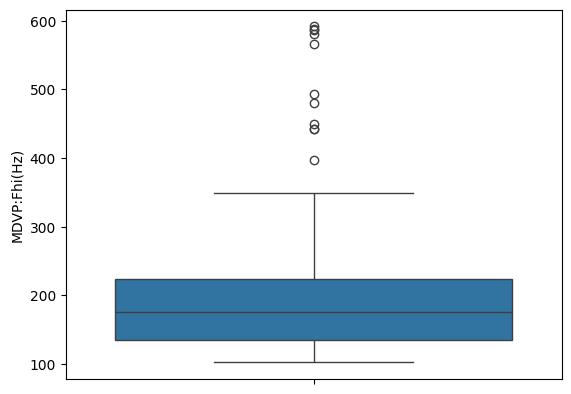

In [ ]:
sns.boxplot(data = provided_data['MDVP:Fhi(Hz)'])

<Axes: ylabel='NHR'>

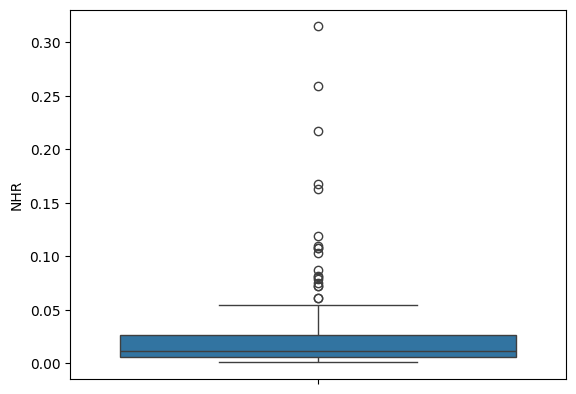

In [ ]:
sns.boxplot(data = provided_data['NHR'])

<Axes: ylabel='MDVP:PPQ'>

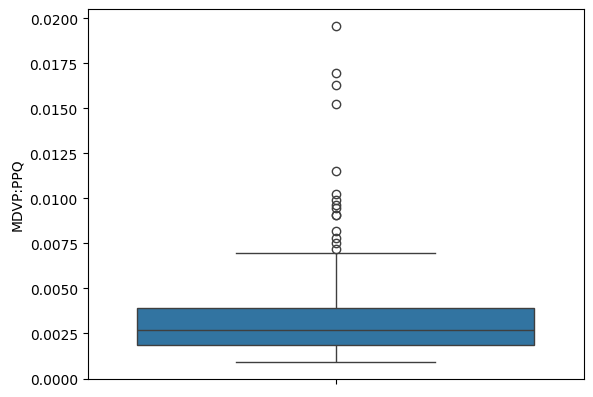

In [ ]:
sns.boxplot(data = provided_data['MDVP:PPQ'])

2. IQR (Interquartile Range)

We take out the IQR value as it is one of the most efficient way to detect outliers as we can detect outliers for the entire dataset easily.

In [ ]:
Q1 = provided_data.quantile(0.25)
Q3 = provided_data.quantile(0.75)
IQR = Q3 - Q1
print(IQR)

MDVP:Fo(Hz)         65.721500
MDVP:Fhi(Hz)        89.558000
MDVP:Flo(Hz)        55.764000
MDVP:Jitter          0.003855
MDVP:Jitter(Abs)     0.000038
MDVP:RAP             0.002193
MDVP:PPQ             0.002077
Jitter:DDP           0.006575
MDVP:Shimmer         0.021178
MDVP:Shimmer(dB)     0.201250
Shimmer:APQ3         0.011605
Shimmer:APQ5         0.012592
MDVP:APQ             0.016198
Shimmer:DDA          0.034810
NHR                  0.019902
HNR                  5.900250
Target               0.000000
RPDE                 0.165181
D2                   0.086372
DFA                  1.369702
spread1              0.105576
spread2              0.540186
PPE                  0.115376
dtype: float64


REMOVING OUTLIERS

Now that we have detected outliers, we need to remove them as well.

In [ ]:
provided_data_out = provided_data[~((provided_data < (Q1 - 1.5 * IQR)) |(provided_data > (Q3 + 1.5 * IQR))).any(axis=1)]
provided_data_out.shape


(113, 23)

LINE CHART

Using the line chart we give an overview of the different biomedical voice measurements as per their frequencies.

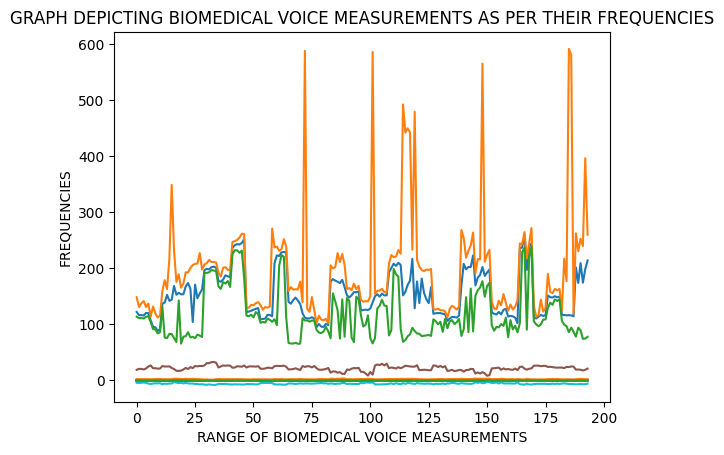

In [ ]:
plt.plot(provided_data)
plt.title('GRAPH DEPICTING BIOMEDICAL VOICE MEASUREMENTS AS PER THEIR FREQUENCIES')
plt.ylabel('FREQUENCIES')
plt.xlabel('RANGE OF BIOMEDICAL VOICE MEASUREMENTS')
plt.show()

**PCA MODEL**

We use PCA (Principal Component Analysis) as it reduces the number of variables or features in a data set while still preserving the most important information.

In [ ]:
pca_model = PCA()
principalfit = pca_model.fit(provided_data)
principalfit

PCA()

In [ ]:
principaltransform = pca_model.transform(provided_data)
principaltransform

array([[-5.45944899e+01, -1.13589990e+01,  1.69978018e+01, ...,
         1.01277202e-06, -3.83977129e-06,  9.00094419e-07],
       [-7.30889307e+01, -1.29716090e+01,  1.78818479e+01, ...,
        -3.93598676e-06,  4.41369103e-06, -3.98312617e-07],
       [-6.65367035e+01, -1.44774593e+01,  1.86158409e+01, ...,
        -4.06902864e-06,  9.09878414e-07,  5.18586366e-06],
       ...,
       [ 4.25510162e+01, -2.96279245e+01, -3.66079786e+01, ...,
         4.92682900e-06,  2.69231638e-06, -6.95364648e-07],
       [ 2.00458961e+02, -4.62861933e+01, -3.52430020e+01, ...,
        -1.44746604e-06,  8.90199255e-07,  4.84994523e-06],
       [ 7.13135958e+01, -7.36926296e+00, -6.24303193e+01, ...,
        -7.64523545e-06, -1.46908449e-07, -3.23300263e-07]])

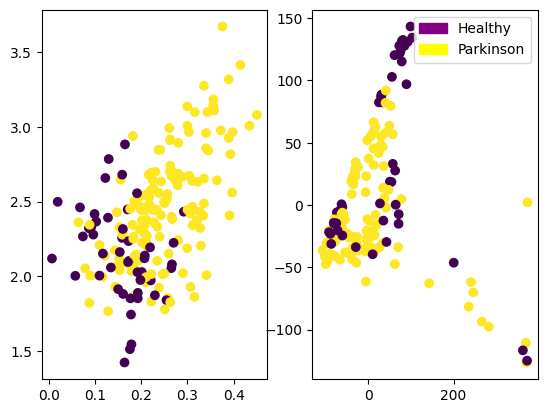

In [ ]:
label_frame = provided_data['Target']
plt.subplot(1,2,1)
plt.scatter(provided_data['spread1'], provided_data['spread2'], c = label_frame)
plt.subplot(1,2,2)
plt.scatter(principaltransform[:,0], principaltransform[:,1], c = label_frame)
purple_patch = mpatches.Patch(color = 'purple', label = 'Healthy')
yellow_patch = mpatches.Patch(color = 'yellow', label = 'Parkinson')
plt.legend(handles = [purple_patch,yellow_patch])



HISTOGRAM showing the frequencies that help us to differentiate between healthy people and people sufferring from parkinson's disease.

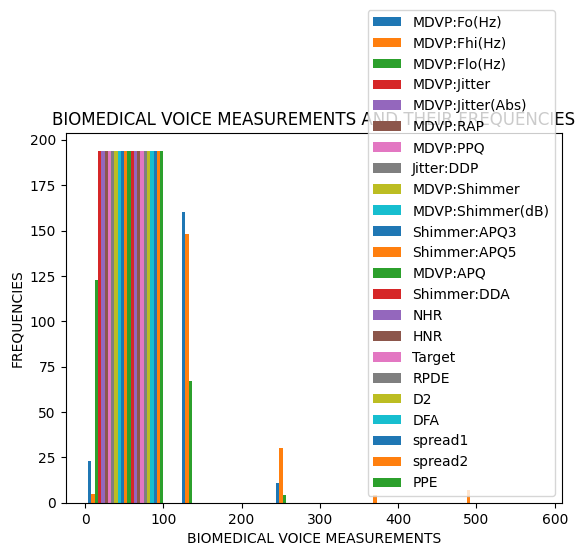

In [ ]:
plt.hist(provided_data, bins = 5)
plt.title('BIOMEDICAL VOICE MEASUREMENTS AND THEIR FREQUENCIES')
plt.ylabel('FREQUENCIES')
plt.xlabel('BIOMEDICAL VOICE MEASUREMENTS')
plt.legend(['MDVP:Fo(Hz)','MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)','MDVP:Jitter','MDVP:Jitter(Abs)','MDVP:RAP','MDVP:PPQ','Jitter:DDP','MDVP:Shimmer','MDVP:Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','MDVP:APQ',
'Shimmer:DDA','NHR','HNR','Target','RPDE','D2','DFA','spread1','spread2','PPE'])
plt.show()


Looking at the above histogram it is hard to explain what is going on. To make it easy for us to understand we use the first 5 frequencies which gives us a better understanding

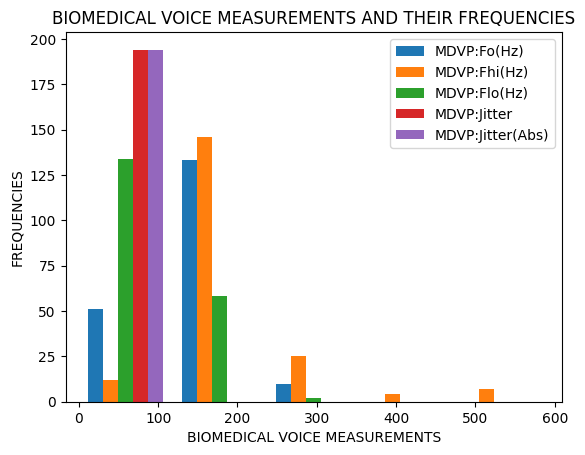

In [ ]:
new_data = provided_data.drop(['MDVP:RAP','MDVP:PPQ','Jitter:DDP','MDVP:Shimmer','MDVP:Shimmer(dB)','Shimmer:APQ3','Shimmer:APQ5','MDVP:APQ',
'Shimmer:DDA','NHR','HNR','Target','RPDE','D2','DFA','spread1','spread2','PPE'], axis = 1)
plt.hist(new_data, bins = 5)
plt.title('BIOMEDICAL VOICE MEASUREMENTS AND THEIR FREQUENCIES')
plt.ylabel('FREQUENCIES')
plt.xlabel('BIOMEDICAL VOICE MEASUREMENTS')
plt.legend(['MDVP:Fo(Hz)','MDVP:Fhi(Hz)', 'MDVP:Flo(Hz)','MDVP:Jitter','MDVP:Jitter(Abs)','MDVP:RAP'])
plt.show()


# BUILDING THE MODEL

Standardizing data

We start by standardising our data to ensure the reliability, compliance, security, and accuracy of data.

In [ ]:
stand = provided_data-provided_data.mean()/provided_data.std()
stand

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter,MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,Target,RPDE,D2,DFA,spread1,spread2,PPE
0,118.672527,146.497916,111.141941,-1.268724,-1.257034,-1.105948,-1.236916,-1.096741,-1.508524,-0.816859,...,-1.443145,-0.594225,14.151167,-0.739537,-4.337779,-12.219682,1.138146,-2.372313,-3.721008,-1.917387
1,112.954527,128.958916,108.877941,-1.267904,-1.257024,-1.105158,-1.236066,-1.094351,-1.517534,-0.960859,...,-1.454475,-0.600425,15.717167,-0.739537,-4.366243,-12.213915,0.770159,-2.396730,-3.865604,-1.953427
2,112.948527,135.718916,108.688941,-1.268434,-1.257024,-1.105578,-1.236896,-1.095631,-1.514944,-0.925859,...,-1.449465,-0.599985,15.710167,-0.739537,-4.361169,-12.219968,1.095837,-2.373756,-3.802309,-1.917086
3,112.286527,139.628916,107.977941,-1.265564,-1.257004,-1.104048,-1.234796,-1.091021,-1.505614,-0.858859,...,-1.432475,-0.595845,14.715167,-0.739537,-4.378782,-12.215719,1.465551,-2.473390,-3.875683,-1.875726
4,116.824527,129.009916,111.109941,-1.268724,-1.257034,-1.105968,-1.236376,-1.096801,-1.522854,-0.986859,...,-1.467325,-0.601295,16.444167,-0.739537,-4.380574,-12.214134,0.970471,-2.408792,-4.020303,-1.928286
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,170.460527,228.825916,91.583941,-1.273814,-1.257084,-1.107968,-1.241286,-1.102781,-1.528994,-1.037859,...,-1.467095,-0.585875,14.583167,-1.739537,-4.347699,-12.381304,-1.325248,-2.585951,-3.550387,-2.153011
190,205.788527,250.864916,86.810941,-1.272764,-1.257084,-1.107288,-1.240956,-1.100741,-1.542354,-1.179859,...,-1.489055,-0.595415,14.213167,-1.739537,-4.364464,-12.355959,-0.981987,-2.578600,-3.423551,-2.117166
191,170.960527,237.852916,71.609941,-1.264804,-1.257034,-1.104358,-1.238236,-1.091951,-1.546784,-1.186859,...,-1.499135,-0.506365,12.949167,-1.739537,-4.388571,-12.383520,-1.573859,-2.549450,-3.528091,-2.154333
192,195.036527,394.808916,72.226941,-1.271004,-1.257074,-1.106898,-1.239976,-1.099591,-1.546904,-1.201859,...,-1.499235,-0.541285,14.086167,-1.739537,-4.344917,-12.395247,-1.531239,-2.500449,-4.069255,-2.162755


**NORMALISING DATA**

Now we are normalising the data in order to transform features to be on a similar scale.

In [ ]:
norm = provided_data-provided_data.min()/provided_data.max()-provided_data.min()
norm

,MDVP:Fo(Hz),MDVP:Fhi(Hz),MDVP:Flo(Hz),MDVP:Jitter,MDVP:Jitter(Abs),MDVP:RAP,MDVP:PPQ,Jitter:DDP,MDVP:Shimmer,MDVP:Shimmer(dB),...,Shimmer:DDA,NHR,HNR,Target,RPDE,D2,DFA,spread1,spread2,PPE
0,33.727395,46.332467,48.069237,-0.042663,-0.02685,-0.027746,-0.040947,-0.019811,-0.028314,0.475716,...,-0.00012,0.016575,10.388576,1.0,-0.172683,-0.450617,0.617449,0.315389,0.675873,0.239680
1,28.009395,28.793467,45.805237,-0.041843,-0.02684,-0.026956,-0.040097,-0.017421,-0.037324,0.331716,...,-0.01145,0.010375,11.954576,1.0,-0.201147,-0.444850,0.249462,0.290972,0.531277,0.203640
2,28.003395,35.553467,45.616237,-0.042373,-0.02684,-0.027376,-0.040927,-0.018701,-0.034734,0.366716,...,-0.00644,0.010815,11.947576,1.0,-0.196073,-0.450903,0.575140,0.313946,0.594572,0.239981
3,27.341395,39.463467,44.905237,-0.039503,-0.02682,-0.025846,-0.038827,-0.014091,-0.025404,0.433716,...,0.01055,0.014955,10.952576,1.0,-0.213686,-0.446654,0.944854,0.214312,0.521198,0.281341
4,31.879395,28.844467,48.037237,-0.042663,-0.02685,-0.027766,-0.040407,-0.019871,-0.042644,0.305716,...,-0.02430,0.009505,12.681576,1.0,-0.215478,-0.445069,0.449774,0.278910,0.376578,0.228781
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
189,85.515395,128.660467,28.511237,-0.047753,-0.02690,-0.029766,-0.045317,-0.025851,-0.048784,0.254716,...,-0.02407,0.024925,10.820576,0.0,-0.182603,-0.612239,-1.845945,0.101751,0.846494,0.004056
190,120.843395,150.699467,23.738237,-0.046703,-0.02690,-0.029086,-0.044987,-0.023811,-0.062144,0.112716,...,-0.04603,0.015385,10.450576,0.0,-0.199368,-0.586894,-1.502684,0.109102,0.973330,0.039901
191,86.015395,137.687467,8.537237,-0.038743,-0.02685,-0.026156,-0.042267,-0.015021,-0.066574,0.105716,...,-0.05611,0.104435,9.186576,0.0,-0.223475,-0.614455,-2.094556,0.138252,0.868790,0.002734
192,110.091395,294.643467,9.154237,-0.044943,-0.02689,-0.028696,-0.044007,-0.022661,-0.066694,0.090716,...,-0.05621,0.069515,10.323576,0.0,-0.179821,-0.626182,-2.051936,0.187253,0.327626,-0.005688


**PLOTTING THE NORMALISED DATA**

We have seen a similar graph as a part of our exploratory analysis but  we use our normalised data instead of the given dataset, as normalising the datset removes several fields with duplicate information.

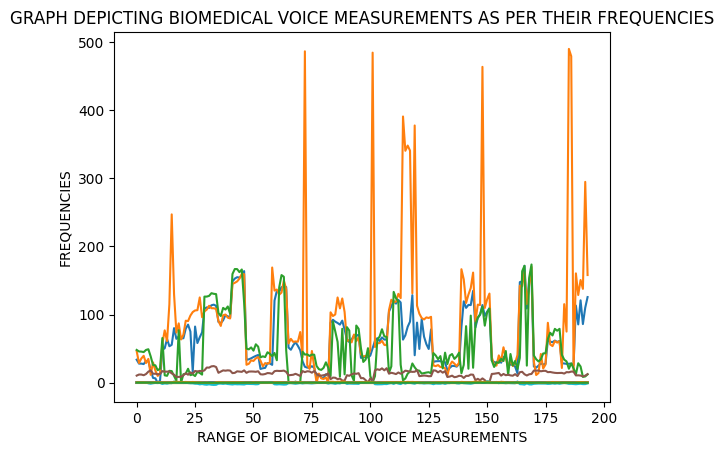

In [ ]:
plt.plot(norm)
plt.title('GRAPH DEPICTING BIOMEDICAL VOICE MEASUREMENTS AS PER THEIR FREQUENCIES')
plt.ylabel('FREQUENCIES')
plt.xlabel('RANGE OF BIOMEDICAL VOICE MEASUREMENTS')
plt.show()

**DECISION TREE**

Since we know that our data requires a classification and clusterring model. We start by plotting a decision tree for the same data but using 2 different techniques.We do that as it provide an effective method for making decisions because they lay out the problem and all the possible outcomes.

In [ ]:
X = provided_data.drop(['Target'], axis = 1)
Y = provided_data['Target']
train_X, test_X, train_Y, test_Y = train_test_split(X, Y, test_size = 0.2)
TREE = DecisionTreeClassifier()
TREE

DecisionTreeClassifier()

In [ ]:
fit = TREE.fit(train_X, train_Y)

1 st type of Decision tree


In [ ]:
tree = export_text(TREE)
print(tree)

|--- feature_21 <= 0.10
|   |--- feature_5 <= 0.00
|   |   |--- class: 1
|   |--- feature_5 >  0.00
|   |   |--- class: 0
|--- feature_21 >  0.10
|   |--- feature_12 <= 0.02
|   |   |--- feature_0 <= 117.88
|   |   |   |--- feature_0 <= 112.35
|   |   |   |   |--- feature_13 <= 0.02
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_13 >  0.02
|   |   |   |   |   |--- class: 1
|   |   |   |--- feature_0 >  112.35
|   |   |   |   |--- class: 0
|   |   |--- feature_0 >  117.88
|   |   |   |--- feature_9 <= 0.18
|   |   |   |   |--- feature_16 <= 0.54
|   |   |   |   |   |--- feature_2 <= 215.75
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_2 >  215.75
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_16 >  0.54
|   |   |   |   |   |--- feature_9 <= 0.14
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_9 >  0.14
|   |   |   |   |   |   |--- class: 0
|   |   |   |--- feature_9 >  0.18
|   |   |   |   |--- feature_1

The same thing happens here
The only difference is the way it is laid down

In [ ]:
plt.figure(figsize = (120,80))
plot_tree(TREE, filled = True, feature_names = provided_data.columns)
plt.title('DECISION TREE')
plt.show()

In [ ]:
PREDICTION = TREE.predict(test_X)
PREDICTION

array([1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1])

**K-Means Clustering**

As we know K-means is a part of clustering and helps us understand our data in a unique way by grouping things together. Therefore, we use it for our dataset.

In [ ]:
SCALER = StandardScaler()
SCALER.fit(provided_data)
SCALER.transform(provided_data)

array([[-0.77463033, -0.53211433, -0.06261361, ...,  1.31106976,
         0.27331968,  1.80696112],
       [-0.91302495, -0.72390916, -0.11475593, ...,  1.01814586,
        -0.10445691,  1.40626646],
       [-0.91317017, -0.6499863 , -0.1191088 , ...,  1.29375849,
         0.06090983,  1.81030766],
       ...,
       [ 0.4909132 ,  0.46688314, -0.97307744, ..., -0.81399312,
         0.77734142, -0.82741726],
       [ 1.07363249,  2.18324949, -0.95886728, ..., -0.22614187,
        -0.63652268, -0.92105351],
       [ 1.44938913,  0.68856424, -0.88818496, ..., -0.4275308 ,
         0.45260394, -0.64017811]])

In [ ]:
kmeans = KMeans(n_clusters = 2, init = 'random', n_init = 1)
kmeans.fit(provided_data)


KMeans(init='random', n_clusters=2, n_init=1)

We use the silhouette score as it is the measure of how similar an object is to its own cluster compared to other clusters. It ranges from -1 to 1, where and no close to 1 means good.

In [ ]:
silhouette_score(provided_data, kmeans.fit_predict(provided_data))

0.4781359519677298

In [ ]:
# make predictions on the dataset
Kmean_predict = kmeans.predict(provided_data)
Kmean_predict

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0,
       1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1], dtype=int32)

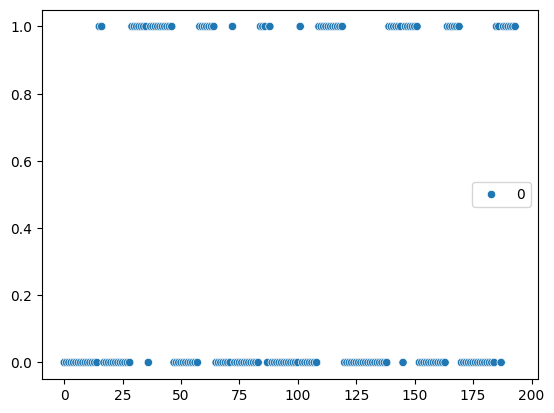

In [ ]:
# construct dataframe containing the clustered information
kmean_new = pd.DataFrame(Kmean_predict)
scatter = sns.scatterplot(kmean_new)
plt.legend()

# RESULT

We start by plotting a boxplot for the given dataset as, a boxplot is a standardized way of displaying the distribution of data based on: minimum, first quartile (Q1), median (Q2), third quartile (Q3), and maximum. It gives us an overview of the five things mentioned above together.

<Axes: >

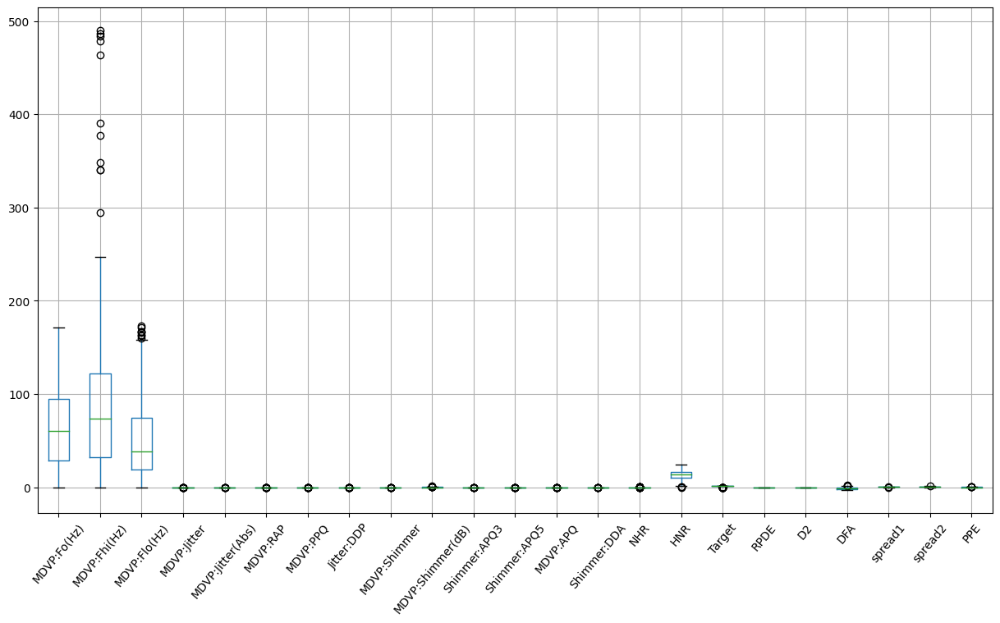

In [ ]:
pd.plotting.boxplot(norm, figsize = (15,8), rot = 50)

**PAIRPLOT**
We use the pairplot as it gives us the overview of all the biomedical voice measurements and their frequencies based on target. The pairplot below
represents people sufferring from Parkinson's disease and healthy people.

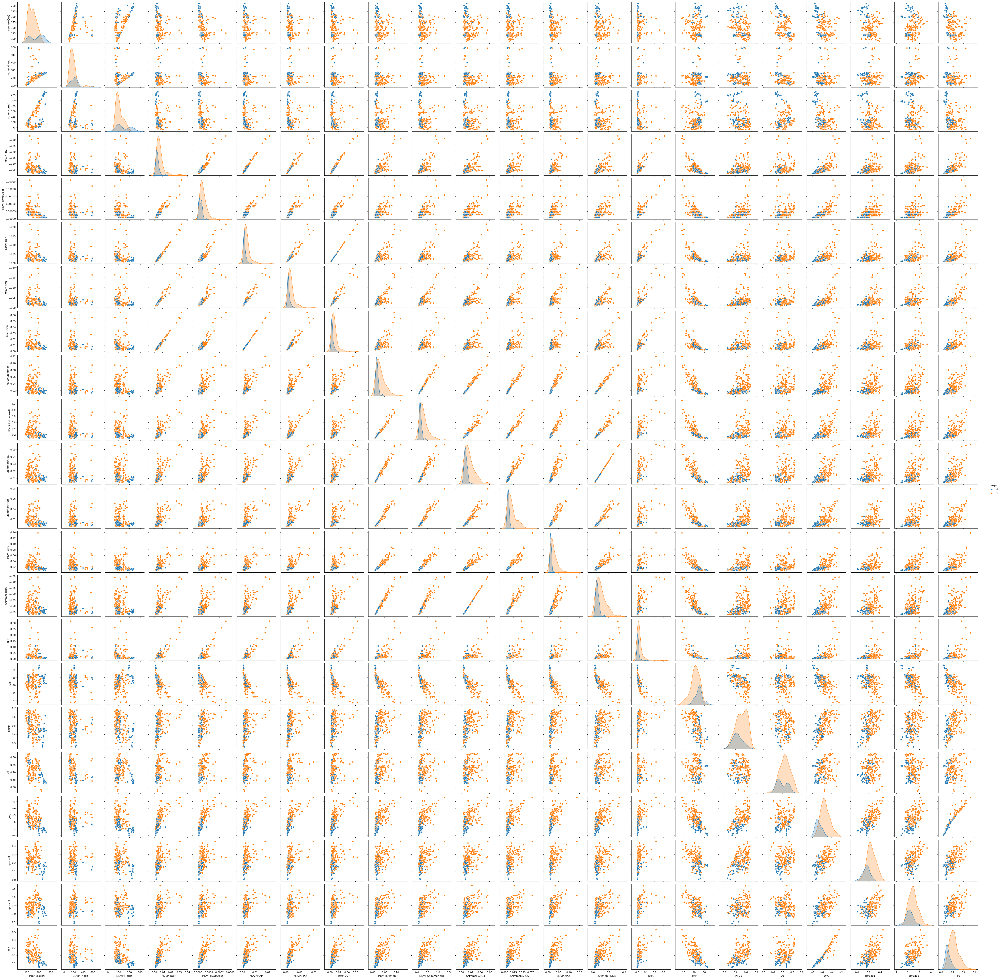

In [ ]:
sns.pairplot(provided_data, hue = 'Target')

**CONFUSION MATRIX**

We use the confusion matrix it represents the prediction summary in matrix form. It shows how many prediction are correct and incorrect per class. More the accuracy better is the model.

Accuracy: 0.8717948717948718


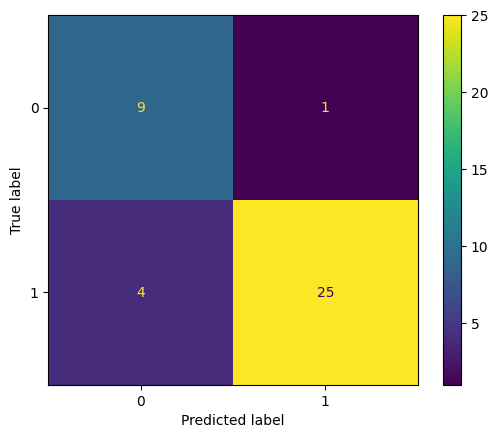

In [ ]:
cm = confusion_matrix(test_Y,PREDICTION)
# visualise the confusion matrix with ConfusionMatrixDisplay
DISPLAY = ConfusionMatrixDisplay(cm)
DISPLAY.plot()
# what is the accuracy on the testing set?
print('Accuracy: '+ str(accuracy_score(test_Y, PREDICTION)))

The count variable counts the number of people with Parkinson's disease and healthy people.Looking at the answer we can say that number of people sufferring from parkinson's disease is way more than the  number of healthy people.

In [ ]:
count = label_frame.value_counts()
count

Target
1    146
0     48
Name: count, dtype: int64

**PIE CHART**

The pie chart below is another method which shows us that number of people with Parkinson's disease is way more than number of healthy people

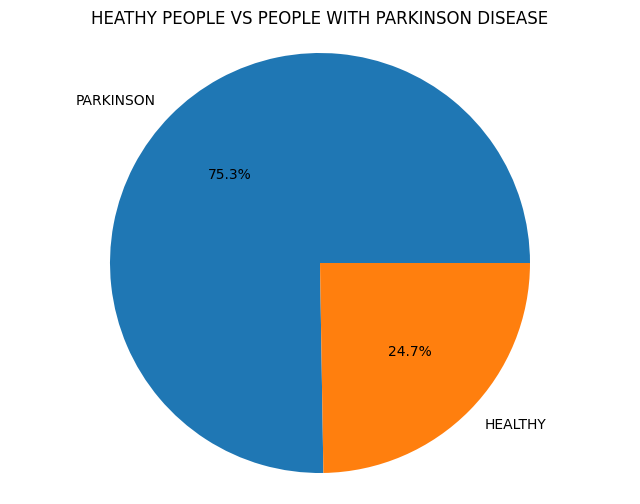

In [ ]:
plt.figure(figsize = (8, 6))
plt.pie(count, labels = ['PARKINSON', 'HEALTHY',] , autopct = '%1.1f%%')
plt.title('HEATHY PEOPLE VS PEOPLE WITH PARKINSON DISEASE')
plt.axis('equal')
plt.show()

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _c

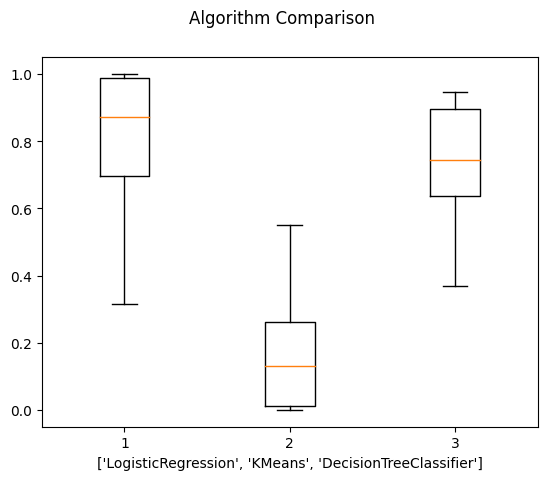

In [ ]:
from sklearn import model_selection
models = []
models.append(('LogisticRegression', LogisticRegression()))
models.append(('KMeans', KMeans()))
models.append(('DecisionTreeClassifier', DecisionTreeClassifier()))
results = []
names = []
for name, model in models:
 kfold = model_selection.KFold(n_splits=10)
 scoring = 'accuracy'

 cv_results = model_selection.cross_val_score(model, X, Y, cv = kfold, scoring = scoring)
 results.append(cv_results)
 names.append(name)


fig = plt.figure()
fig.suptitle('Algorithm Comparison')
plt.boxplot(results)
plt.xlabel(names)
plt.show()

# CONCLUSION

We started by reading the data and adding column names to the data provided had no column names. Then we checked the types of data and the presence of any duplicate rows and found that there were no duplicate rows present in the given dataset. Then we checked for outliers using 2 techniques boxplot and IQR(Inter Quartile Range) and removed them to avoid lowering the accuracy. We used a bunch of graphs to show range of biomedical voice measurements and their frequencies. Our main model consisted of 2 different kinds of decision tree containing the same information but presented in a different layout.
We also used logistic regression for our target attribute which differentiates between people with Parkinson's disease and healthy people.
We used K-means clusterring as it makes handling large datasets easy. The accuracy obtained for the testing set looks quite good. As we all know higher the accuracy better is the model. Towards the end, we have a pie chart from which we can clearly see that number of people sufferring from Parkinson's disease is way more than healthy people.
Hence we use biomedical voice measurements for detection of Parkinson's disease because it is one of the most efficient way which has been proved throughout the model and by looking at the accuracy rate.

# REFERRENCES

[1] Sheibani, Razieh; Nikookar, Elham; Alavi, Seyed Enayatollah. An Ensemble Method for Diagnosis of Parkinson's Disease Based on Voice Measurements. Journal of Medical Signals & Sensors 9(4):p 221-226, Oct–Dec 2019. | DOI: 10.4103/jmss.JMSS_57_18

[2] Ayap, N. F. M., Eugenio, B. A., Hinolan, J. I. V., Puno, J. C. V., Baldovino, R. G., & Billones, R. K. C. (2021, October). A Biomedical Voice Measurement Diagnosis of Parkinson’s Disease through the utilization of Artificial Neural Network. In Journal of Physics: Conference Series (Vol. 2071, No. 1, p. 012038). IOP Publishing

[3] Tracy, J. M., Özkanca, Y., Atkins, D. C., & Ghomi, R. H. (2020). Investigating voice as a biomarker: deep phenotyping methods for early detection of Parkinson's disease. Journal of biomedical informatics, 104, 103362.

[4] Novotný, M., Dušek, P., Daly, I., Růžička, E., & Rusz, J. (2020). Glottal source analysis of voice deficits in newly diagnosed drug-naïve patients with Parkinson’s disease: correlation between acoustic speech characteristics and non-speech motor performance. Biomedical Signal Processing and Control, 57, 101818.
